#### Apache Kafka is a distributed streaming platform

* Apache kafka is horizantally scalable , fault tolerant and distributed streaming platform for creating and processing streams in realtime.
* <b> Kafka is a master less cluster. Then how does it works when any one of broker/machine fails/crash?
* When broker starts, it connects to zookeeper and creates ephimeral node under /brokers/id and it remains active as long as broker active.</b>

* How does it works ?
    * Publisher(messsage Producer) -> Broker(Message Broker) -> Subscriber(message consumer)
    * Producer and Consumers both are client application
* kafka created at linked in and open sourced in 2011

<b> For a Typical Dataware house/applications becomes like this when the business grows over a period of a time and not able to manage them and some where some part of the application fails/crash.</b>

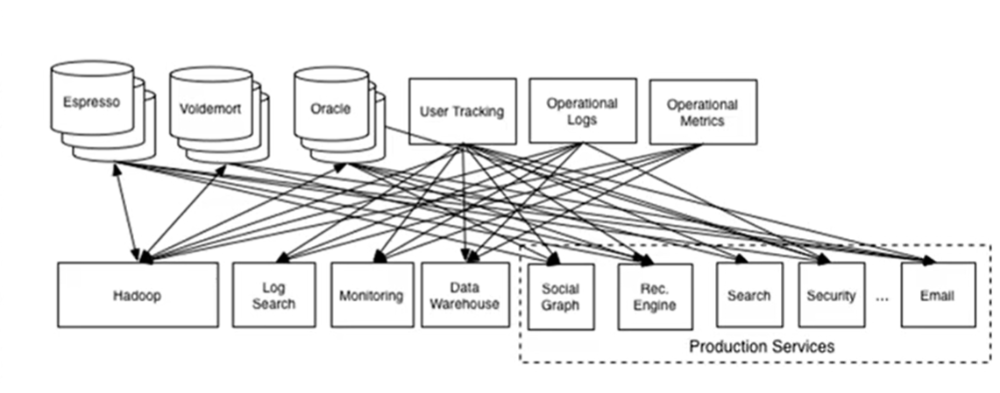

Kafka evolved into 5 core components over a period of time from open source to 2019
    * Kafka Broker
    * Kafka Client
    * Kafka Connect
    * Kafka Streams
    * KSQL

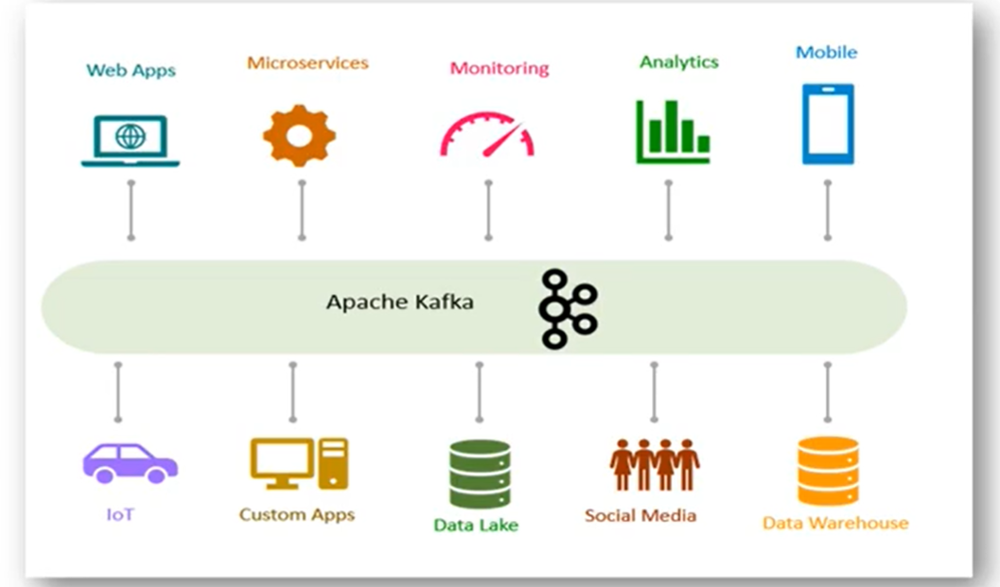

<b> What is a Kafka Controller ?</b>
* Kafka Controller is also a broker and elected as Controller. There's always one controller active on the cluster.Controller is responisible for monitoring brokers and when notices any one of broker left the cluster, then reassign works to other brokers.

When controller dies, every node tries to elect as controller only one succeeds and others get exception.

<b> What is a Producer ?</b>
* Producer is an application that sends data(Message Record). For kafka it is simple array of bytes. We create producer and  stream file data and sends each line as message.

<b> What is a Consumer ?</b>
* Consumer is an application that receives data(Message Record). Producers are not going to send data directly to consumer. An application that's requesting data from Kafka server.

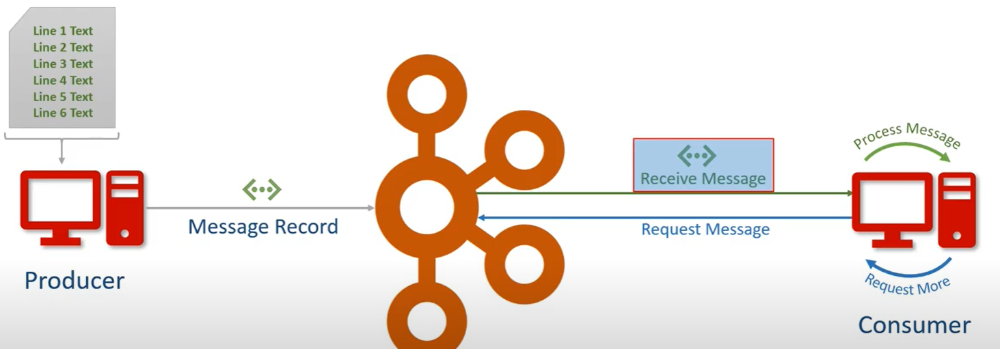

#### Kafka Broker
* The broker is a kafka Server, it's a meaning full name. Broker exchanges data between producer and consumer

<b> What is a Cluster ?</b>
* Cluster is a group of computers acting together to serve specific purpose. 

<b> What is a Topic ?</b>
* Topic is a unique name for data stream. If you Compare to RDBMS it's equalent to database table.
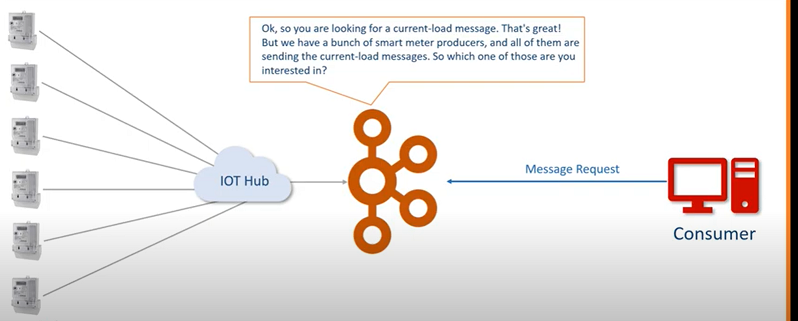

* Like table data stores into data file, topic also stores data/messages as log file. 

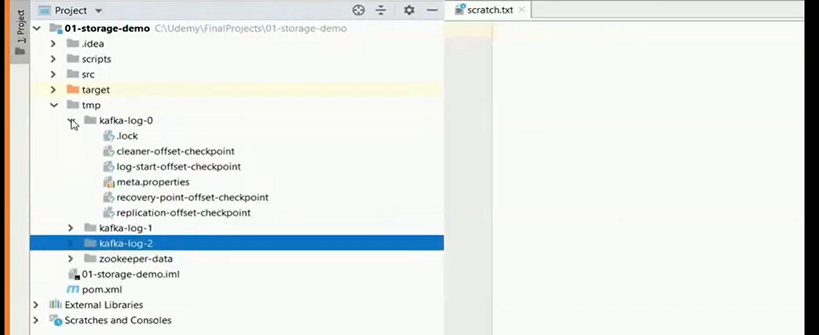

<b> What is a Partition ?</b>
* Partition is smallest unit(just a directory) stores in a single machine , can't be splitted. A topic can have massive data(millions of data) , it may be larger than the storage capacity of single computer. So, breaking the topic into multiple parts and distribute into multiple machines. No of partitions in a topic is design time decision.

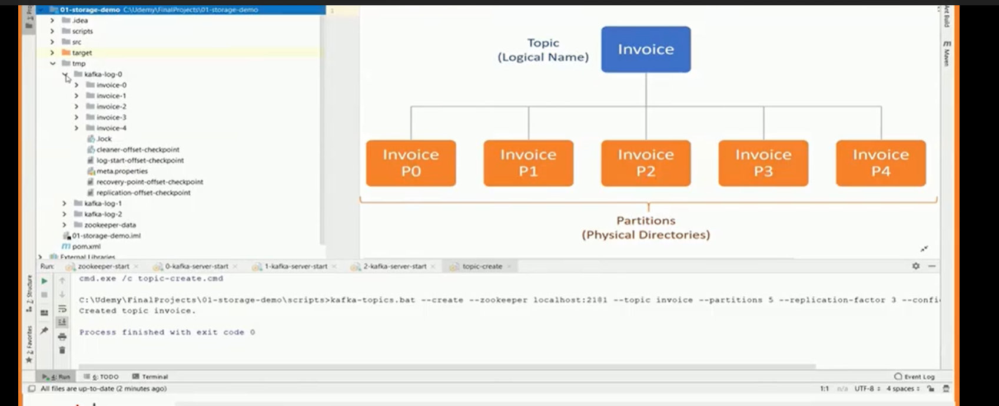

* <b>Replication Factor </b>

    * No of copies of each partition
    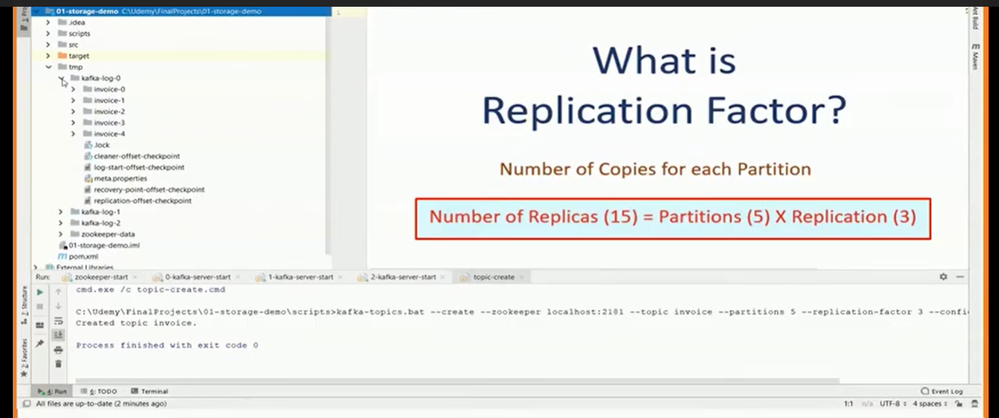
    
*  <b>Log File</b>

    * Kafka log file splits into several files called segments. Each segment will have a fixed size, and once it's crossed then it creates another segment. The default size for each segment is 1GB, however it can be configurable.
    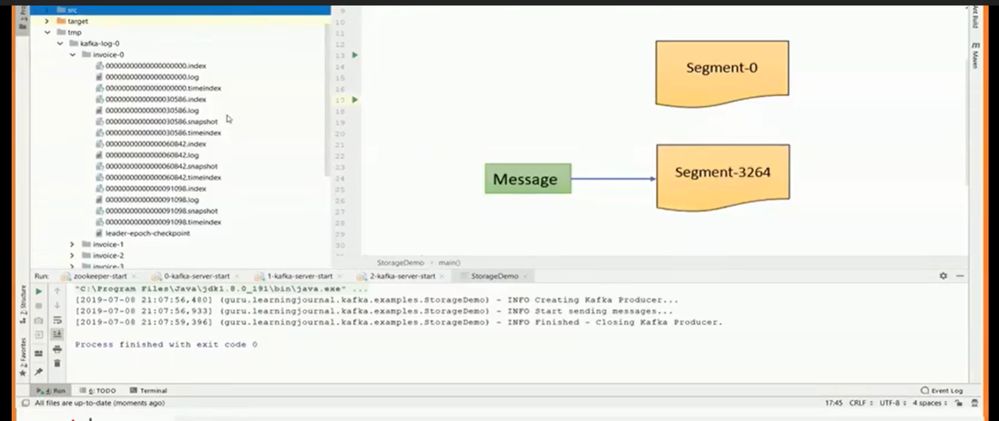
    
*  <b>Leader</b>
    * Once leader is elected for any of partition and it's their responsibilites to sync with followers. Producers will directly send messages to leader and it persist the data and send an acknowledgement. Then replicating copies into followers. Consumer will read the messages from the leader. Producer and Consumer will always interact with leaders

*  <b>Follower</b>

    * Followers are duplicate copy of leader partitions. Followers are little behine leader partition data. Once leaders sents messages to follower, it persists it and ask for next. So, that leader comes to know how far the follower in sync.
    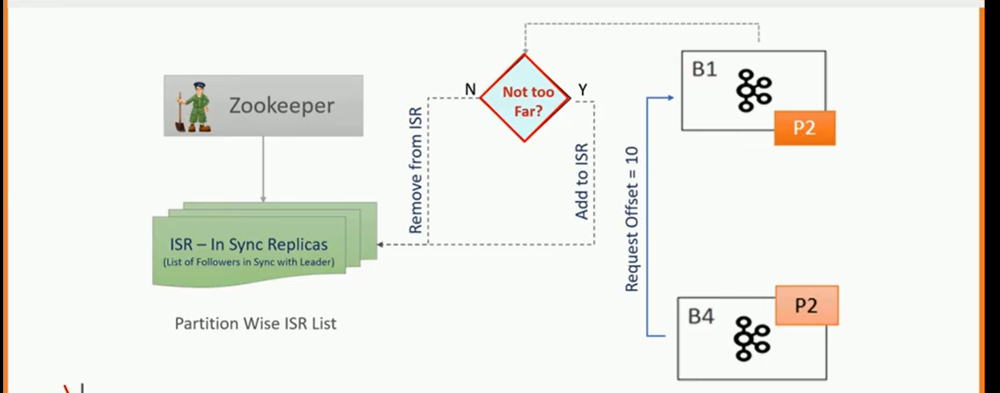

* <b>Partition Distribution to achieve Fault tolerance</b>

    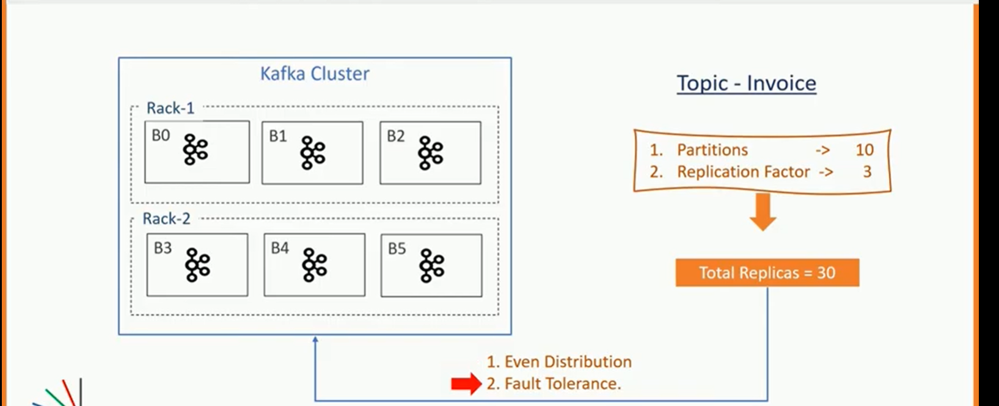
    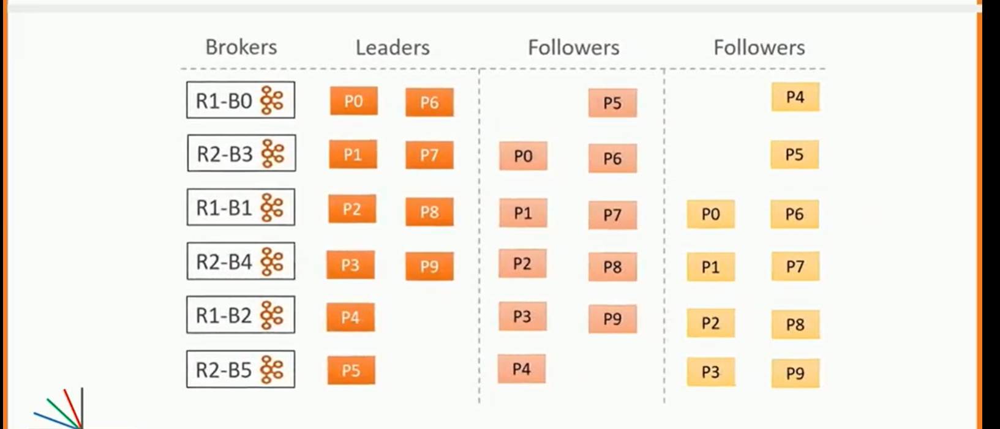


<b> What is a Offset ?</b>
* Offset is unique sequence id(64 bit integer) with in the partition for each message. Once message received it assigns offset(seqid) to each message in a partition.

<b> What is a Consumer Group ?</b>
* Consumer Group is group of conusmers. Multiple consumers will form a group and share the work to accomplish bigger tasks.

#### Kafka Connect
Kafka connect is a component of kafka, for connecting, and moving data between kafka and external systems. kafka Connect itself is a cluster.

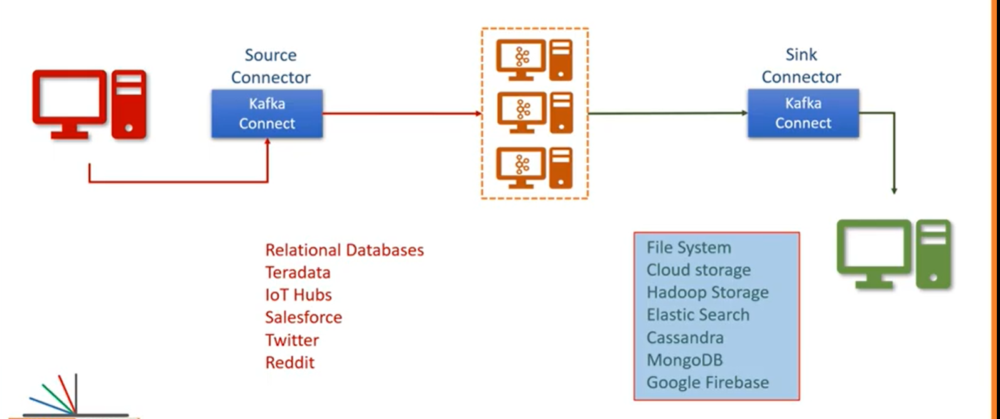

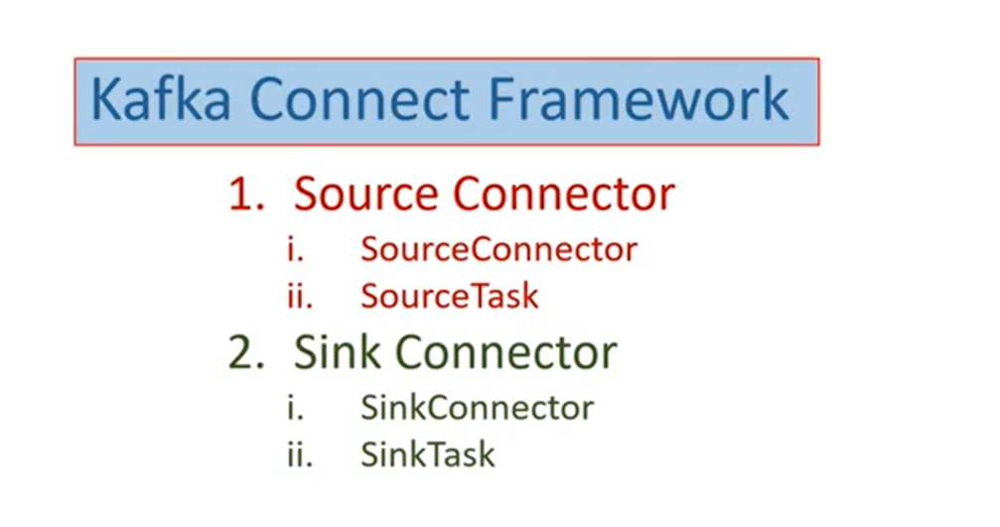

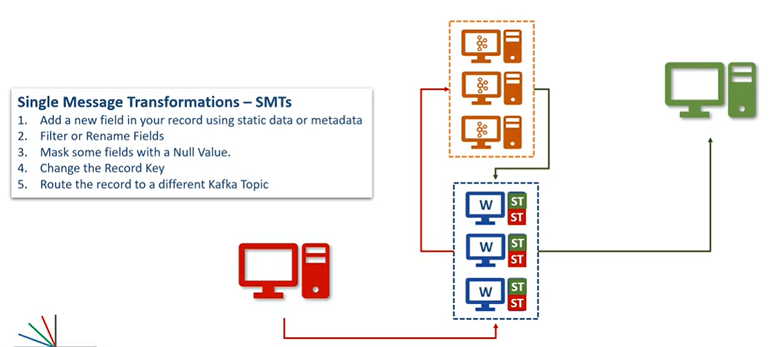

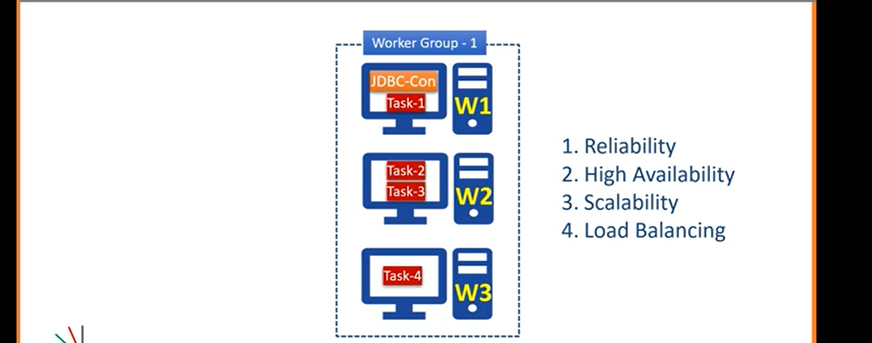

#### Kafka Streams
* Unbounded, infinite ever growing sequence of data in small size data. Stream processing is also a data processing but it's continuous data. Kafka streams could be also a cluster and you can scale up/down.

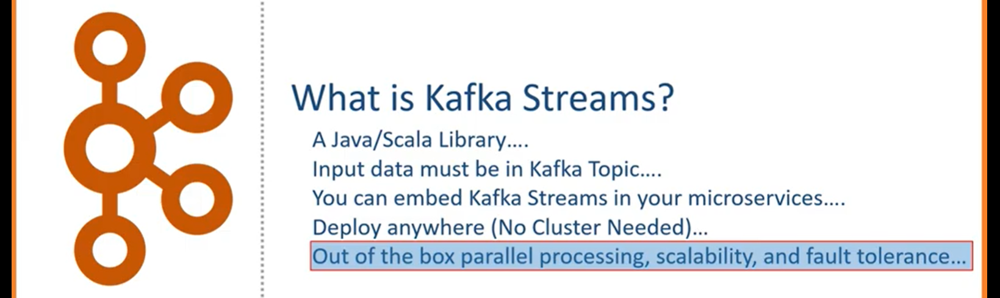

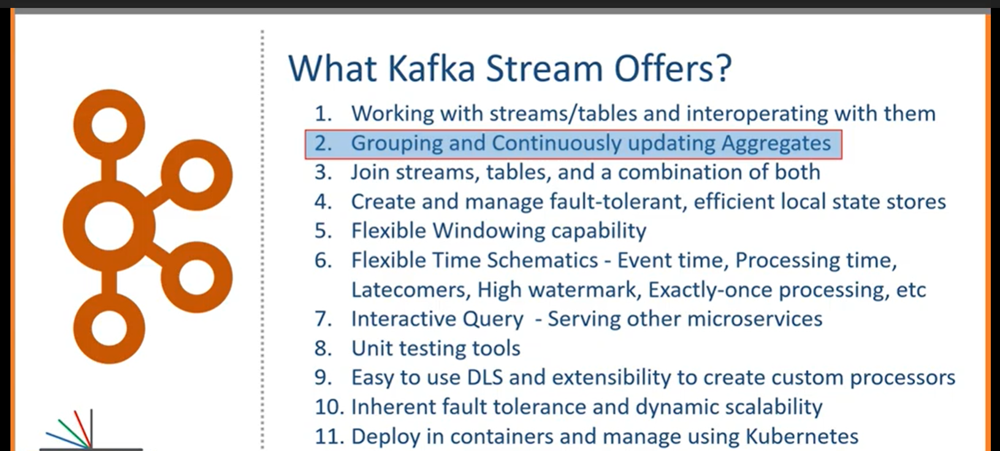

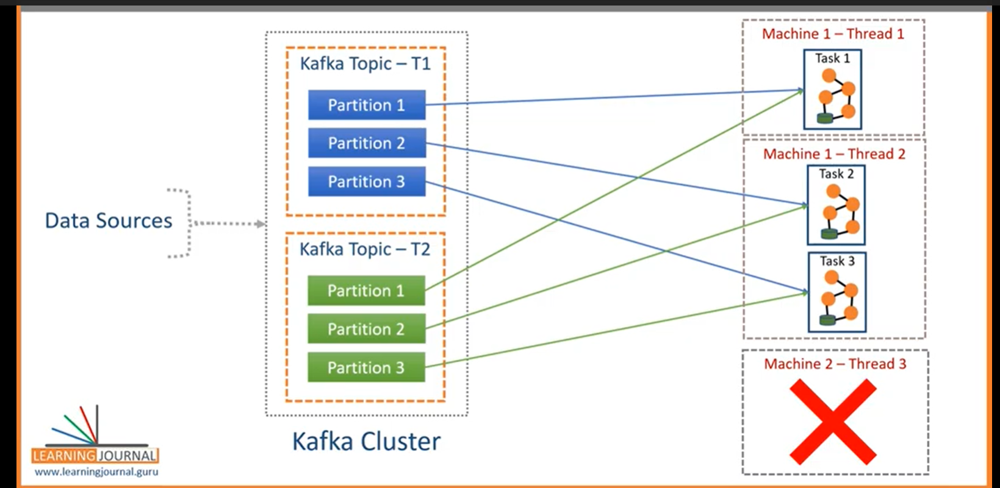

#### Kafka SQL
* KSQL is an sql interface to Kafka Streams
    * Interactive Mode/CLI
        * Ideal for development mode
    * Head less mode
        * ideal for production mode

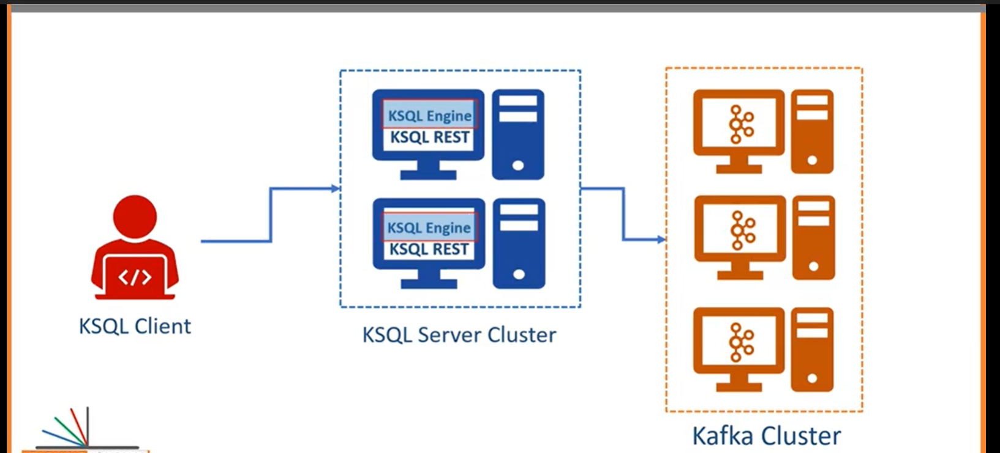

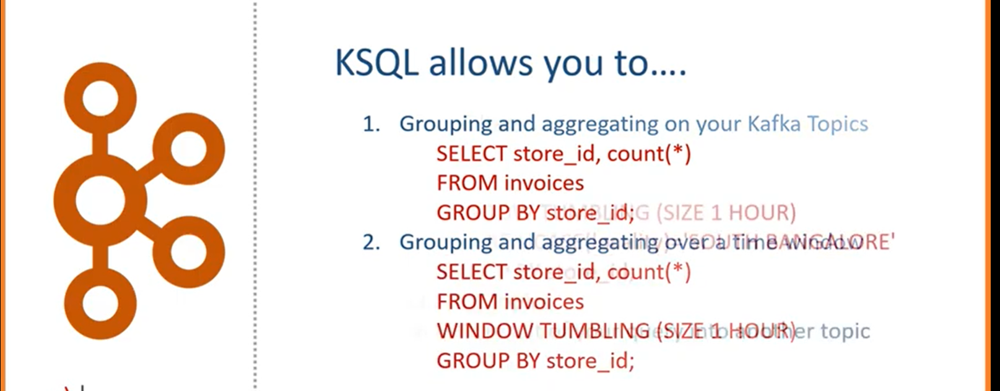

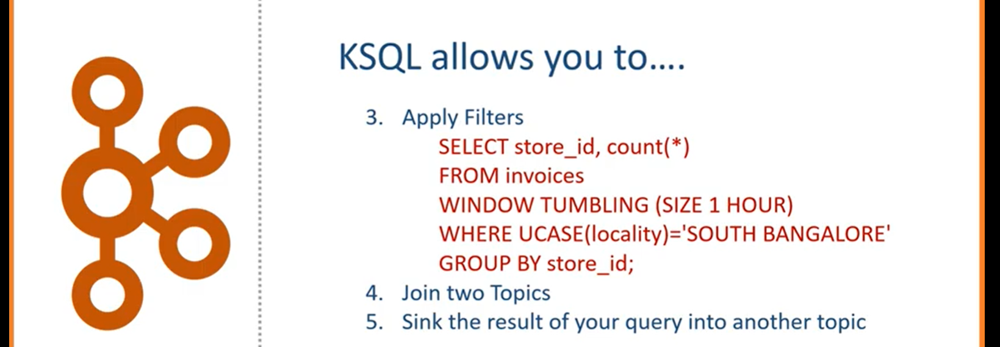

### Kafka Multinode cluster setup

copy server.properties files into two more and rename server-0.properties,server-1.properties,server-2.properties
rename broker id,port,logdir in 1,2 server.properties files

<code>
set environment variables
sudo vi /home/hadoop/kafka_2.11-2.2.0/bin/kafka-run-class.sh

export JAVA_HOME=/home/hadoop/jdk1.8.0_261
export PATH=$PATH:$JAVA_HOME/bin
#enable listeners in config/server.properties if you are not able access from kafka consumer or any error range error

cd /kafka_2.11-2.2.0

sudo rm -rf /home/hadoop/logs/kafka/*
sudo rm -rf /home/hadoop/logs/kafka/*

sudo $KAFKA_HOME/bin/zookeeper-server-start.sh $KAFKA_HOME/config/zookeeper.properties	


sudo $KAFKA_HOME/bin/kafka-server-start.sh $KAFKA_HOME/config/server-0.properties
sudo $KAFKA_HOME/bin/kafka-server-start.sh $KAFKA_HOME/config/server-1.properties
sudo $KAFKA_HOME/bin/kafka-server-start.sh $KAFKA_HOME/config/server-2.properties

$KAFKA_HOME/bin/kafka-topics.sh --create --topic topic1 --zookeeper localhost:2181 --replication-factor 3 --partitions 3 
$KAFKA_HOME/bin/kafka-topics.sh --create --topic topic2 --zookeeper localhost:2181 --replication-factor 2 --partitions 4 


$KAFKA_HOME/bin/kafka-console-producer.sh --broker-list localhost:9092 --topic topic1
$KAFKA_HOME/bin/kafka-console-producer.sh --broker-list localhost:9092 --topic topic2>emp.csv

$KAFKA_HOME/bin/kafka-console-consumer.sh --topic topic1 --from-beginning --bootstrap-server localhost:9092
$KAFKA_HOME/bin/kafka-console-consumer.sh --topic topic2 --from-beginning --bootstrap-server localhost:9092

$KAFKA_HOME/bin/kafka-topics.sh --zookeeper localhost:2181 --list
$KAFKA_HOME/bin/kafka-topics.sh --zookeeper localhost:2181 --delete --topic topic1
$KAFKA_HOME/bin/kafka-topics.sh --zookeeper localhost:2181 --delete --topic topic2
$KAFKA_HOME/bin/kafka-topics.sh --zookeeper localhost:2181 --unavailable-partitions

$KAFKA_HOME/bin/kafka-topics.sh --zookeeper localhost:2181 --describe --topic topic1
$KAFKA_HOME/bin/kafka-topics.sh --zookeeper localhost:2181 --describe --topic topic2

to see log files offset:

$KAFKA_HOME/bin/kafka-dump-log.sh --files /home/hadoop/logs/kafka/kafka-logs-1/topic1-2/00000000000000000000.log

</code>